##End-To-End Multi-class Breed classification

## This is Colab Notebook

In [ ]:
# !unzip "drive/MyDrive/dog-vision/dog-breed-identification/dog-breed-identification.zip" -d "drive/MyDrive/dog-vision/dog-breed-identification"

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
tf.__version__,hub.__version__

('2.12.0', '0.13.0')

In [ ]:
print("GPU") if tf.config.list_physical_devices("GPU") else print("NO")

GPU


In [ ]:
import pandas as pd
labels_csv=pd.read_csv("drive/MyDrive/dog-vision/dog-breed-identification/labels.csv")

In [ ]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


<Axes: >

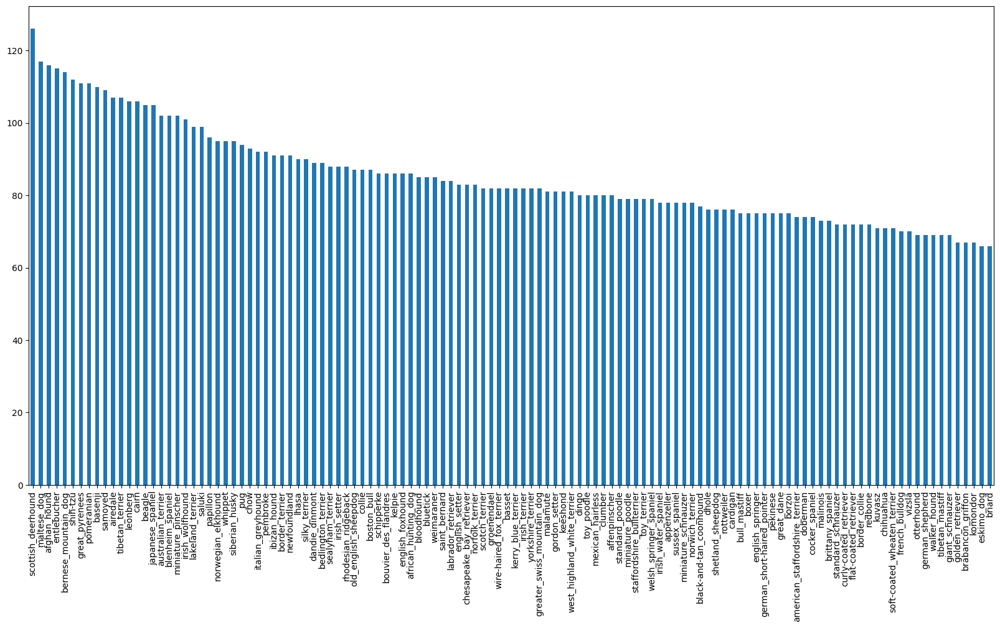

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

In [ ]:
labels_csv["breed"].value_counts().min()

66

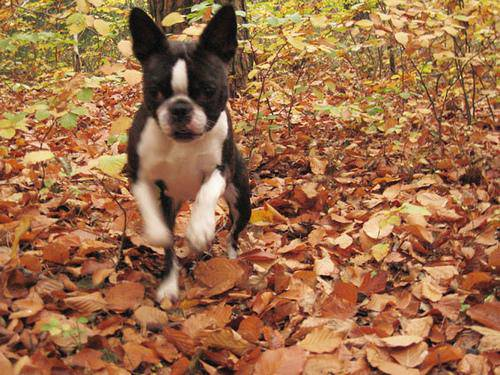

In [ ]:
from IPython.display import Image
Image("drive/MyDrive/dog-vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
filename=["drive/MyDrive/dog-vision/dog-breed-identification/train/"+fname+".jpg" for fname in labels_csv["id"]]

In [ ]:
import os
if len(os.listdir("drive/MyDrive/dog-vision/dog-breed-identification/train/"))==len(filename):
  print ("Y")

Y


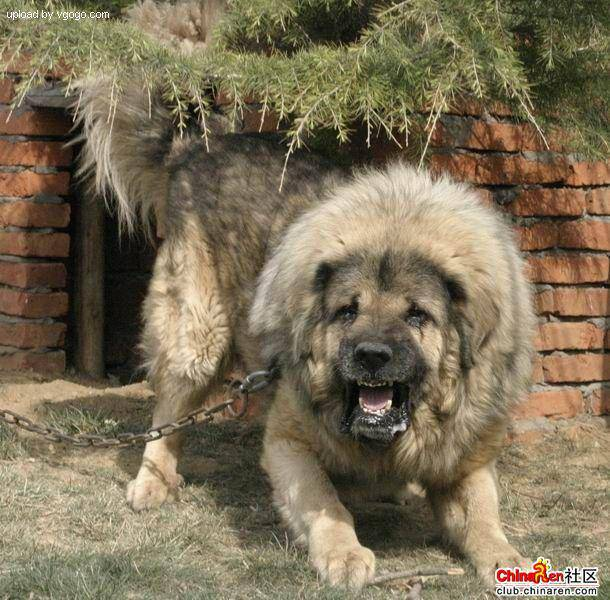

In [ ]:
Image(filename[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [ ]:
import numpy as np
labels=labels_csv["breed"]
labels=np.array(labels)

In [ ]:
unique_breeds=np.unique(labels)

In [ ]:
len(unique_breeds)

120

In [ ]:
boolean_labels=[label==unique_breeds for label in labels]


In [ ]:
for i in range(0,len(boolean_labels)):
  boolean_labels[i]=boolean_labels[i].astype(int)

In [ ]:
boolean_labels[0]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [ ]:
x=filename
y=boolean_labels

In [ ]:
NUM_IMAGES=1000 #@param{type:"slider",min:1000,max:10000,step:100}


In [ ]:
from sklearn.model_selection import train_test_split
np.random.seed(42)
X_train,X_val,Y_train,Y_val=train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,
                                            random_state=42)
len(X_train),len(X_val),len(Y_train),len(Y_val)

(800, 200, 800, 200)

In [ ]:
from matplotlib.pyplot import imread
image=imread(filename[42])
image.shape

(257, 350, 3)

In [ ]:
image.shape

(257, 350, 3)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [ ]:
IMG_SIZE=224
def process_image(image_path):
  img=tf.io.read_file(image_path)
  img=tf.image.decode_jpeg(img,channels=3)
  img=tf.image.convert_image_dtype(img,tf.float32)
  img=tf.image.resize(img,size=[IMG_SIZE,IMG_SIZE])
  return img


In [ ]:
def get_image_label(image_path,label):
    image=process_image(image_path)
    return image,label

In [ ]:
process_image(x[42]),tf.constant(y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
BATCH_SIZE=32
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
    if test_data:
      print("CREATE TESTING DATASET...")
      data=tf.data.Dataset.from_tensor_slices((tf.constant(X)))
      data_batch=data.map(process_image).batch(BATCH_SIZE)
      return data_batch
    elif valid_data:
      print("CREATE VALIDATION DATASET...")
      data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
      data_batch=data.map(get_image_label).batch(BATCH_SIZE)
      return data_batch
    else:
       print("CREATE TRAINING DATASET...")
       data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
       data=data.shuffle(buffer_size=len(X))
       data_batch=data.map(get_image_label).batch(BATCH_SIZE)
       return data_batch

In [ ]:
train_data=create_data_batches(X_train,Y_train)
val_data=create_data_batches(X_val,Y_val,valid_data=True)

CREATE TRAINING DATASET...
CREATE VALIDATION DATASET...


In [ ]:
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.int32, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.int32, name=None)))

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.int32, name=None))>

In [ ]:
import matplotlib.pyplot as plt
def show_25_images(images,labels):
  plt.figure(figsize=(10,10))
  for i in range (25):
    ax=plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")
  plt.show()

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())
len(train_images),len(train_labels)

(32, 32)

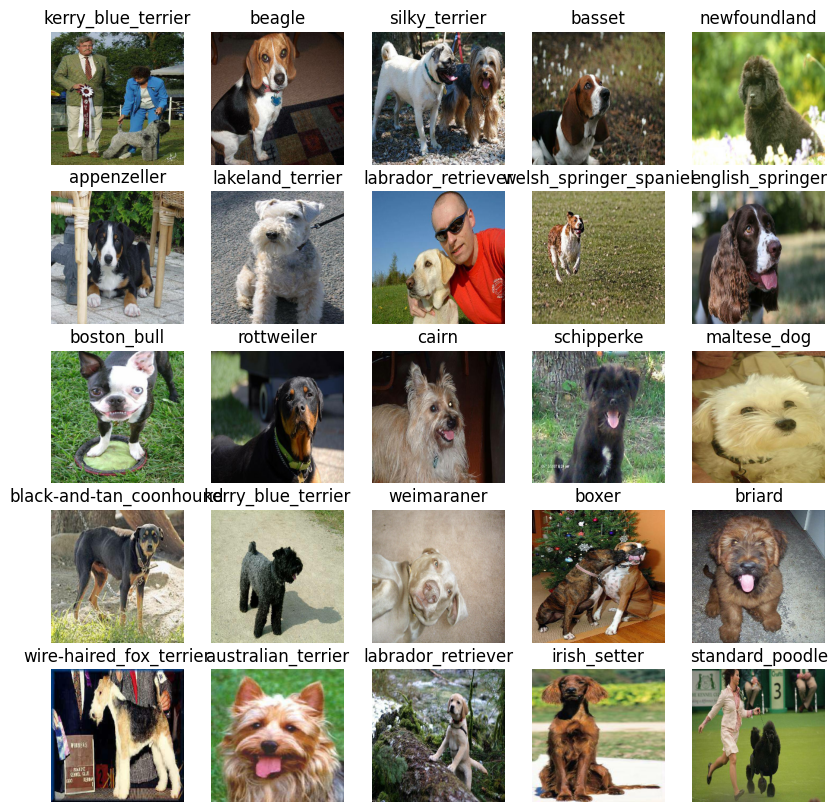

In [ ]:
show_25_images(train_images,train_labels)

In [ ]:
val_train,val_labels=next(val_data.as_numpy_iterator())
len(val_train),len(val_labels)

(32, 32)

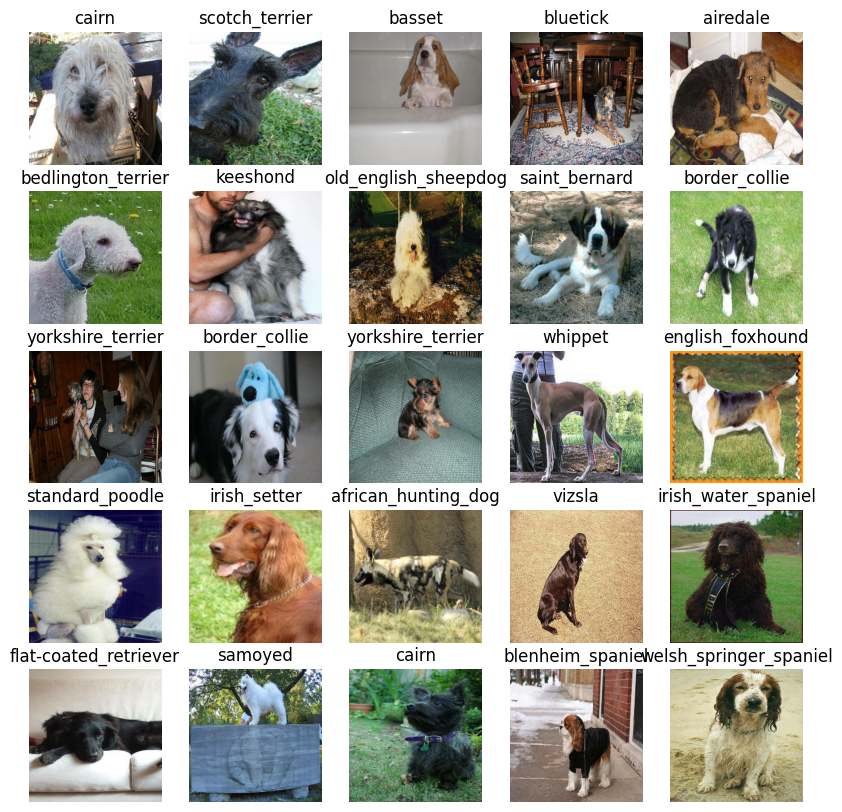

In [ ]:
show_25_images(val_train,val_labels)

In [ ]:
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]
OUTPUT_SHAPE=len(unique_breeds)
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [ ]:
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,modelurl=MODEL_URL):
  print("BUILDING MODLE with ",modelurl)
  model=tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),#input layer
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,activation="softmax")#output layer
  ])
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])
  model.build(INPUT_SHAPE)
  return model

In [ ]:
model=create_model()
model.summary()

BUILDING MODLE with  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
%load_ext tensorboard
import os


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime
def create_tensorboard_callback():
  logdir=os.path.join("drive/MyDrive/dog-vision/dog-breed-identification/logs", datetime.datetime.now().strftime("%y%m%d-%H%M%S" ))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=3)

## Training a Model
to be trained on 1000 Images to Make sure everything is runnning

In [ ]:
NUM_EPOCKS=100 #@param {type:"slider",min:10,max:100,step:10}

In [ ]:
print("GPU") if tf.config.list_physical_devices("GPU") else print("NO")

GPU


In [ ]:
def train_model():
  model=create_model()
  tensorboard=create_tensorboard_callback()

  model.fit(x=train_data,
            epochs=NUM_EPOCKS
            ,validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping]
            )
  return model

In [ ]:
model=train_model()

BUILDING MODLE with  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 16s 174ms/step - loss: 4.4994 - accuracy: 0.0950 - val_loss: 3.4155 - val_accuracy: 0.2850
Epoch 2/100
25/25 [==============================] - 4s 164ms/step - loss: 1.5972 - accuracy: 0.7150 - val_loss: 2.2028 - val_accuracy: 0.5150
Epoch 3/100
25/25 [==============================] - 7s 263ms/step - loss: 0.5482 - accuracy: 0.9337 - val_loss: 1.7311 - val_accuracy: 0.5750
Epoch 4/100
25/25 [==============================] - 7s 277ms/step - loss: 0.2487 - accuracy: 0.9875 - val_loss: 1.5493 - val_accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - 4s 148ms/step - loss: 0.1444 - accuracy: 0.9962 - val_loss: 1.4608 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 6s 231ms/step - loss: 0.0991 - accuracy: 0.9987 - val_loss: 1.4138 - val_accuracy: 0.6350
Epoch 7/100
25/25 [=============================

## Checking The TensorFlow Log

The TensorFlow Magic Function %tensoflow access to logs directory we createdearlier and visualize its content

In [ ]:
%tensorboard --logdir drive/MyDrive/dog-vision/dog-breed-identification/logs

<IPython.core.display.Javascript object>

In [ ]:
predictions=model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 6s 98ms/step


array([[1.09338819e-03, 1.63658799e-04, 5.99526800e-04, ...,
        5.23899915e-04, 2.52542395e-05, 3.18968133e-03],
       [5.42270439e-03, 1.23780977e-03, 3.69851105e-02, ...,
        5.91747114e-04, 7.35869340e-04, 2.50520534e-04],
       [1.40907854e-04, 4.06753425e-05, 2.48767901e-05, ...,
        1.72194996e-04, 7.84744698e-05, 8.37161933e-05],
       ...,
       [1.23889395e-05, 2.51084741e-04, 4.09547392e-05, ...,
        4.03422164e-05, 2.38866254e-04, 2.74789618e-05],
       [2.49820040e-03, 3.94215778e-04, 2.32722014e-04, ...,
        3.80329839e-05, 1.42080253e-05, 8.32671858e-03],
       [6.44442334e-04, 4.52127933e-05, 1.53836259e-03, ...,
        1.21823500e-03, 1.61478913e-03, 2.84569833e-04]], dtype=float32)

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.int32, name=None))>

In [ ]:
len(predictions)

200

In [ ]:
def predict_label(i):
  return unique_breeds[i.argmax()],i.max()

In [ ]:

predict_label(predictions[81])

NameError: ignored

In [ ]:
def unbatch(elements):
  dataset=tf.data.Dataset.from_generator(lambda: elements ,tf.int64)
  dataset=dataset.unbatch()
  return list(dataset.as_numpy_iterator())

In [ ]:
def unbatchify(data):
  images=[]
  labels=[]
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax([label])])
  return images,labels

In [ ]:
images,labels=unbatchify(val_data)

In [ ]:
images[0],labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
predict_label(labels[0])

AttributeError: ignored

In [ ]:
predict_label(predictions[0])

('border_terrier', 0.27020025)

In [ ]:
labels[0]

'cairn'

In [ ]:
def plot_pred(prediction_prob,labels,images,n=1):
  pred_prob,true_label,image = prediction_prob[n],labels[n],images[n]
  pred_label=predict_label(pred_prob)[0]
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  if pred_label==true_label :
    color="green"
  else:
    color="red"
  plt.title("{} {:2.0f}% {}".format(pred_label,np.max(pred_prob)*100,
            true_label),
            color=color)


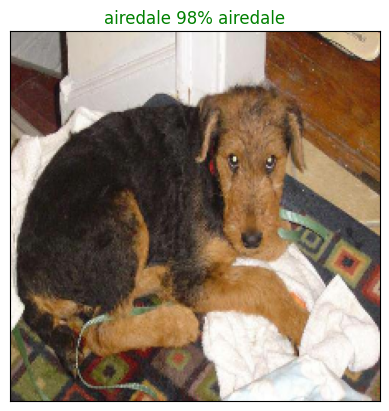

In [ ]:
plot_pred(predictions,labels,images,n=4)

In [ ]:
def predict_labels(i):
  return unique_breeds[i.argmax()],i.max()

In [ ]:
def plot_pred_conf(prediction_prob,labels,n=1):
  pred_prob,true_label = prediction_prob[n],labels[n]
  predict_label=predict_labels(pred_prob)[0]
  top10_pred_values=predictions[n][predictions[n].argsort()[-10:][::-1]]
  top10_pred_idx=predictions[n].argsort()[-10:][::-1]
  top10_pred_label=unique_breeds[top10_pred_idx]
  top_plot=plt.bar(np.arange(len(top10_pred_label)),
                             top10_pred_values,
                   color="grey")
  plt.xticks(np.arange(len(top10_pred_label)),labels=top10_pred_label,
             rotation="vertical")
  if np.isin(true_label,top10_pred_label):
    top_plot[np.argmax(top10_pred_label==true_label)].set_color("green")
  else :
    pass

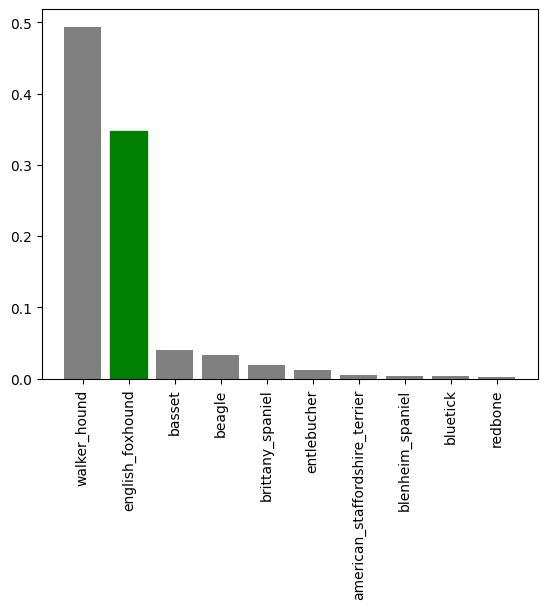

In [ ]:
plot_pred_conf(prediction_prob=predictions,labels=labels,n=42)

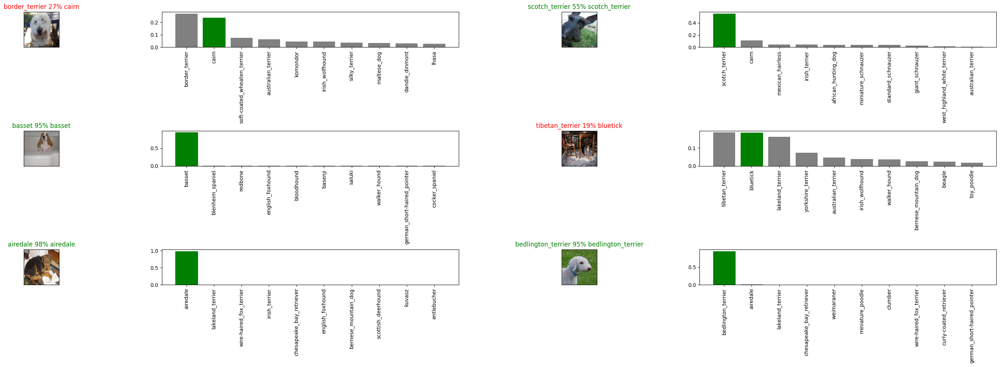

In [ ]:
i_multiplier=0
n_rows=3
n_cols=2
n_img=n_rows*n_cols
plt.figure(figsize=(10*n_rows,5*n_cols))
for i in range(n_img):
  plt.subplot(n_rows,2*n_cols,2*i+1)
  plot_pred(predictions,labels,images,n=i+i_multiplier)
  plt.subplot(n_rows,2*n_cols,2*i+2)
  plot_pred_conf(predictions,labels,i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
def save_models(model,suffix=None):
  modeldir=os.path.join("drive/MyDrive/dog-vision/dog-breed-identification/models",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  modelpath=modeldir+"-"+suffix+".h5"#SAVE FORMAT OF MODEL
  print("Saving model")
  model.save(modelpath)
  return modelpath

In [ ]:
def load_model(model_path):
  print("model_path")
  model=tf.keras.models.load_model(model_path,
                                  custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
save_models(model,suffix="100-img-adam")

Saving model


'drive/MyDrive/dog-vision/dog-breed-identification/models/20230716-13591689515969-100-img-adam.h5'

In [ ]:
model=load_model('drive/MyDrive/dog-vision/dog-breedidentification/models/20230716-10251689503150-100-img-adam.h5')

model_path


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 2s 158ms/step - loss: 1.3190 - accuracy: 0.6450


[1.319003939628601, 0.6449999809265137]

## Training a full model

In [ ]:
len(x),len(y)

(10222, 10222)

In [ ]:
x[:10]

['drive/MyDrive/dog-vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog-vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog-vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog-vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog-vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog-vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog-vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog-vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog-vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog-vision/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
X_train[:10]

NameError: ignored

In [ ]:
full_data=create_data_batches(x,y)

CREATE TRAINING DATASET...


In [ ]:
full_data

NameError: ignored

In [ ]:
full_model=create_model()

BUILDING MODLE with  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
full_model_tensor_board=create_tensorboard_callback()

In [ ]:
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

In [ ]:
full_model.fit(x=full_data,epochs=NUM_EPOCKS,
               callbacks=[full_model_tensor_board,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 53s 148ms/step - loss: 1.3364 - accuracy: 0.6680
Epoch 2/100
320/320 [==============================] - 50s 154ms/step - loss: 0.3956 - accuracy: 0.8851
Epoch 3/100
320/320 [==============================] - 35s 110ms/step - loss: 0.2345 - accuracy: 0.9402
Epoch 4/100
320/320 [==============================] - 41s 127ms/step - loss: 0.1555 - accuracy: 0.9645
Epoch 5/100
320/320 [==============================] - 36s 111ms/step - loss: 0.1054 - accuracy: 0.9781
Epoch 6/100
320/320 [==============================] - 37s 115ms/step - loss: 0.0764 - accuracy: 0.9883
Epoch 7/100
320/320 [==============================] - 37s 116ms/step - loss: 0.0566 - accuracy: 0.9923
Epoch 8/100
320/320 [==============================] - 36s 111ms/step - loss: 0.0462 - accuracy: 0.9946
Epoch 9/100
320/320 [==============================] - 37s 115ms/step - loss: 0.0374 - accuracy: 0.9951
Epoch 10/100
320/320 [==============================] - 36s 113m

In [ ]:
save_models( full_model, suffix="full-imageset-mobilenetv2-Adam")

Saving model


'drive/MyDrive/dog-vision/dog-breed-identification/models/20230716-14201689517227-full-imageset-mobilenetv2-Adam.h5'

In [ ]:
full_model=load_model("drive/MyDrive/dog-vision/dog-breed-identification/models/20230716-14201689517227-full-imageset-mobilenetv2-Adam.h5")

model_path


In [ ]:
test_path="drive/MyDrive/dog-vision/dog-breed-identification/test/"
test_filenames=[test_path +fname for fname in os.listdir(test_path)]

In [ ]:
test_data=create_data_batches(test_filenames,test_data=True)

CREATE TESTING DATASET...


In [ ]:
preds=full_model.predict(test_data,verbose=1)

324/324 [==============================] - 35s 106ms/step


In [ ]:
unique_breeds[preds[0].argmax()]

'toy_terrier'

In [ ]:
np.savetxt("drive/MyDrive/dog-vision/dog-breed-identification/preds_array.csv",preds,delimiter=",")

In [ ]:
test_prediction=np.loadtxt("drive/MyDrive/dog-vision/dog-breed-identification/preds_array.csv",delimiter=",")

In [ ]:
test_prediction[0]

array([2.41394460e-09, 1.00183306e-09, 3.97795077e-08, 2.58532282e-07,
       7.68386030e-07, 7.42552083e-06, 2.61205241e-06, 2.91054748e-04,
       3.82048952e-08, 6.87028034e-08, 3.74054537e-07, 1.13483367e-09,
       1.36633403e-07, 3.78406528e-10, 4.35400355e-10, 3.02621459e-07,
       2.07949311e-10, 8.84153251e-10, 9.76143888e-11, 4.84231975e-07,
       2.11550499e-11, 3.86234239e-11, 9.69792513e-09, 4.04512222e-11,
       1.46895096e-09, 6.14519286e-13, 7.52221894e-08, 1.92261069e-07,
       4.64882854e-10, 6.19886443e-03, 9.18385590e-10, 1.45330683e-11,
       6.96851954e-09, 4.61381466e-09, 3.65528940e-09, 3.34609029e-09,
       7.88307530e-10, 5.33781241e-10, 1.63666718e-05, 7.46090429e-12,
       1.39450604e-10, 2.97998909e-12, 8.18934183e-08, 1.57300306e-08,
       6.95470626e-10, 4.68209578e-08, 1.11262077e-09, 2.91130349e-11,
       5.12337395e-11, 2.35326175e-10, 1.67111889e-08, 2.39576203e-09,
       1.20009709e-08, 2.24434942e-07, 1.31060762e-09, 3.52402658e-08,
      

In [ ]:
test_prediction.shape

(10357, 120)

In [ ]:
preds_df=pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]=test_ids
preds_df[list(unique_breeds)]=test_prediction

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e14211c7b8cba3e46d5802291b765be7,2.413945e-09,1.001833e-09,3.977951e-08,2.585323e-07,7.683860e-07,7.425521e-06,2.612052e-06,2.910547e-04,3.820490e-08,...,6.007758e-06,6.916151e-01,4.666614e-10,3.666944e-09,5.810404e-08,1.285337e-08,5.896304e-07,6.602058e-08,2.025602e-07,5.121125e-06
1,e079440ee0061b92ec22faf17be13908,9.851938e-10,3.091902e-09,2.580196e-12,1.832422e-17,9.250463e-11,1.204349e-15,1.373184e-11,2.951629e-10,1.436111e-13,...,1.108385e-09,1.087209e-11,7.660183e-13,1.130872e-11,1.108352e-11,3.114620e-12,9.034829e-08,2.548509e-14,2.343629e-12,5.400200e-13
2,dfe03aa0ae066e09cdda6e7f6e08390a,4.006442e-10,8.194788e-07,5.311919e-09,3.469013e-10,8.803305e-10,3.535148e-13,3.135657e-12,1.123130e-11,1.463048e-10,...,7.678514e-13,1.296060e-10,1.474789e-11,3.037382e-11,3.131088e-10,6.294845e-11,9.513714e-12,3.600384e-10,3.873755e-12,2.200363e-10
3,e13f3871a8b4a745717ba6903f0dfe05,8.998889e-10,1.601250e-05,1.144581e-08,3.187528e-07,1.794513e-04,5.888305e-09,2.200407e-06,2.359909e-10,1.483807e-06,...,1.169081e-09,8.116176e-12,9.989745e-08,4.309160e-05,1.643764e-05,1.660082e-08,1.244220e-10,5.562579e-05,2.597909e-06,1.371486e-10
4,e440ec011c3c7ea94838ab5fc466159c,1.762759e-06,2.707776e-09,1.256490e-10,1.064094e-10,4.267080e-08,6.512929e-11,3.259881e-11,3.263678e-10,8.292660e-10,...,3.585337e-03,9.230931e-10,1.806864e-08,6.430305e-10,9.139015e-09,2.014899e-12,1.099991e-10,1.715910e-09,2.539494e-08,7.296209e-07


In [ ]:
preds_df.to_csv("drive/MyDrive/dog-vision/dog-breed-identification/model_prediction_submission_1.csv",index=False)

In [ ]:
def predict_image_photo(path):
  data=create_data_batches(path,test_data=True)
  preds=full_model.predict(data)
  cust_image=[]
  for image in data.unbatch().as_numpy_iterator():
    cust_image.append(image)
  return predict_label(preds[0]),cust_image

In [ ]:
custompath="drive/MyDrive/dog-vision/dog-breed-identification/Photos/"

In [ ]:
image_path=[custompath+"dog_image-2.jpg"]
image_path


['drive/MyDrive/dog-vision/dog-breed-identification/Photos/dog_image-2.jpg']

In [ ]:
ls=predict_image_photo(image_path)
print(ls)

CREATE TESTING DATASET...
1/1 [==============================] - 0s 32ms/step
(('pomeranian', 0.99989295), [array([[[0.20525213, 0.09544819, 0.04054622],
        [0.21575631, 0.10595239, 0.05105042],
        [0.22293419, 0.11313026, 0.0582283 ],
        ...,
        [0.5294118 , 0.30980393, 0.18039216],
        [0.5294118 , 0.30980393, 0.18039216],
        [0.52615553, 0.30654764, 0.17713587]],

       [[0.2112764 , 0.10147247, 0.04657051],
        [0.2173726 , 0.10756866, 0.0526667 ],
        [0.2173507 , 0.10754678, 0.05264481],
        ...,
        [0.5261205 , 0.30651262, 0.17710084],
        [0.5261205 , 0.30651262, 0.17710084],
        [0.5283301 , 0.30872226, 0.17931047]],

       [[0.25262606, 0.14569329, 0.08217788],
        [0.25495574, 0.14802296, 0.08450757],
        [0.24829997, 0.14136717, 0.07785177],
        ...,
        [0.5254902 , 0.30588236, 0.1764706 ],
        [0.52690023, 0.30729234, 0.17788059],
        [0.5292336 , 0.30962574, 0.18021396]],

       ...,

      

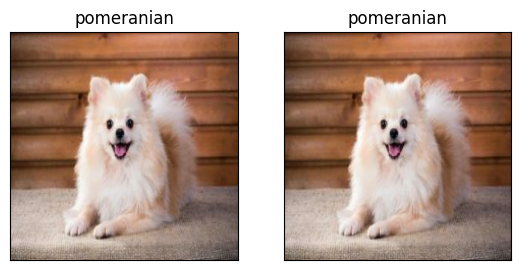

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
for i,image in enumerate( ls):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(ls[0][0])
  plt.imshow(ls[1][0])